In [38]:
%pip install opencv-python h5py numpy tensorflow flax transformers moviepy pytorch-lightning matplotlib seaborn pytorch-forecasting
%pip install torch==2.1.0 torchvision==0.16.0 torchaudio==2.1.0 --index-url https://download.pytorch.org/whl/cu118

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.0.1 -> 23.3.2
[notice] To update, run: C:\Users\SSAFY\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [1]:
import torch
from training.summary.datamodule import SummaryDataset
from transformers import ViTImageProcessor
from tqdm import tqdm
import matplotlib.pyplot as plt
import cv2
import seaborn as sns
import numpy as np
from moviepy.editor import VideoFileClip, concatenate_videoclips

from v2021 import SummaryModel

C:\Users\SSAFY\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
preprocessor = ViTImageProcessor.from_pretrained(
    "google/vit-base-patch16-224", size=224, device='cuda'
)

In [3]:
SAMPLE_EVERY_SEC = 2

video_path = 'videos/test2.mp4'

cap = cv2.VideoCapture(video_path)

n_frames = cap.get(cv2.CAP_PROP_FRAME_COUNT)
fps = cap.get(cv2.CAP_PROP_FPS)

video_len = n_frames / fps

print(f'Video length {video_len:.2f} seconds!')

frames = []
last_collected = -1

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    timestamp = cap.get(cv2.CAP_PROP_POS_MSEC)
    second = timestamp // 1000

    if second % SAMPLE_EVERY_SEC == 0 and second != last_collected:
        last_collected = second
        frames.append(frame)

features = preprocessor(images=frames, return_tensors="pt")["pixel_values"]

print(features.shape)

Video length 1168.29 seconds!
torch.Size([585, 3, 224, 224])


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


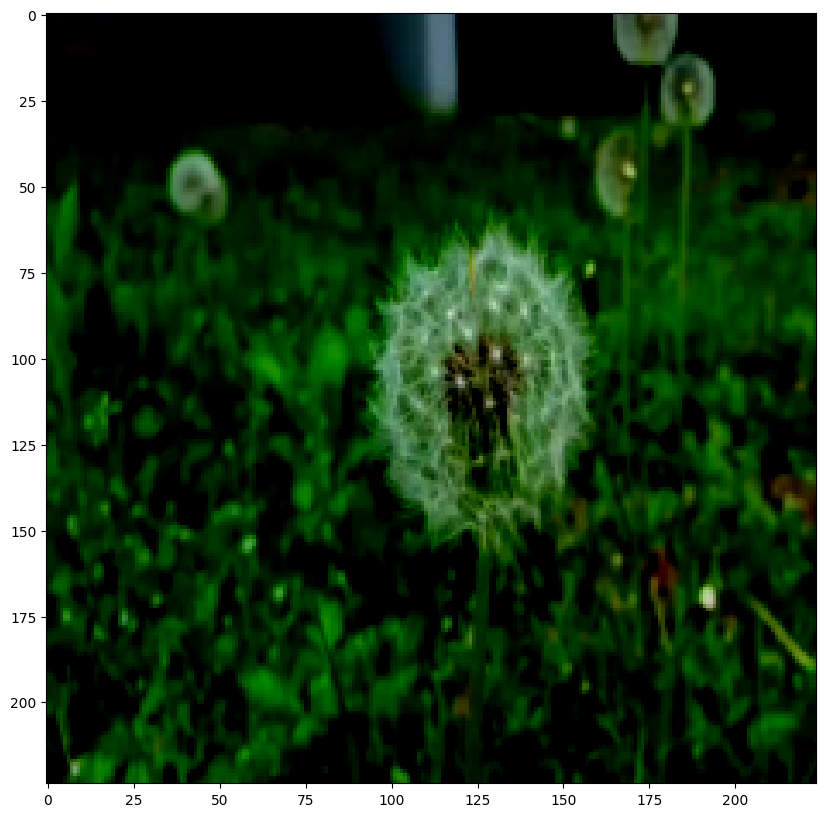

In [4]:
plt.figure(figsize=(10, 10))
plt.imshow(features[0].numpy().transpose(1, 2, 0)[:, :, ::-1])

In [5]:
model = SummaryModel.load_from_checkpoint('summary.ckpt')
model.to('cuda')
model.eval()

Lightning automatically upgraded your loaded checkpoint from v1.4.9 to v2.1.3. To apply the upgrade to your files permanently, run `python -m pytorch_lightning.utilities.upgrade_checkpoint c:\Users\SSAFY\Desktop\github\video-summarization\summary.ckpt`


SummaryModel(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_featu

100%|██████████| 585/585 [00:08<00:00, 68.36it/s]


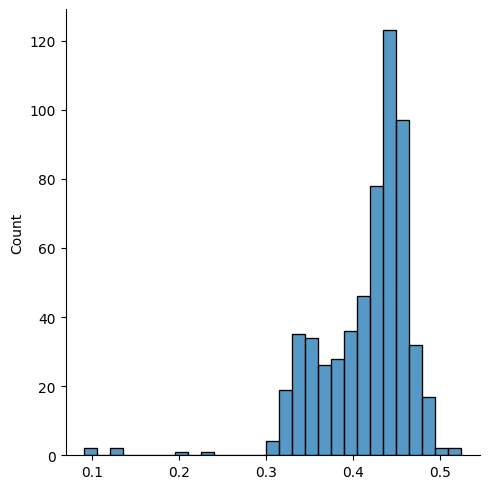

In [6]:
features = features.to('cuda')

y_pred = []

for frame in tqdm(features):
    y_p = model(frame.unsqueeze(0))
    y_p = torch.sigmoid(y_p)

    y_pred.append(y_p.cpu().detach().numpy().squeeze())

y_pred = np.array(y_pred)

sns.displot(y_pred)

In [1]:
def determine_threshold(y_pred, THRESHOLD):
    total_secs = 0

    for i, y_p in enumerate(y_pred):
        if y_p >= THRESHOLD:
            total_secs += SAMPLE_EVERY_SEC
    return total_secs

THRESHOLD = 0.64
total_secs = 100
while(total_secs > 30):
    THRESHOLD -= 0.01
    total_secs = determine_threshold(y_pred, THRESHOLD)

NameError: name 'total_secs' is not defined

In [11]:
clip = VideoFileClip(video_path)

subclips = []

for i, y_p in enumerate(y_pred):
    sec = i * SAMPLE_EVERY_SEC

    if y_p >= THRESHOLD:
        start = sec - SAMPLE_EVERY_SEC
        if start < 0:
            start = 0
        subclip = clip.subclip(start, sec)
        subclips.append(subclip)

result = concatenate_videoclips(subclips)

result.write_videofile("videos/result2.mp4")

result.ipython_display(width=640, maxduration=240)

Moviepy - Building video videos/result2.mp4.
MoviePy - Writing audio in result2TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video videos/result2.mp4



Moviepy - Done !
Moviepy - video ready videos/result2.mp4
Moviepy - Building video __temp__.mp4.
MoviePy - Writing audio in __temp__TEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video __temp__.mp4



Moviepy - Done !
Moviepy - video ready __temp__.mp4
